# HMVA Thesis — Make All Results

Run **Kernel → Restart & Run All** to showcase every analysis. By default this notebook only
**displays the results already committed under `results/`** — nothing is recomputed.

Set `RECOMPUTE = True` in the **Setup** cell to regenerate everything from scratch by calling
the scripts in `analysis/` directly. This requires `data/stock_daily_returns.csv` (the ~2.2 GB
CRSP file, not checked into git) to be present, and internet access + `pandas-datareader` for
the crisis-period analysis (downloads NBER recession dates from FRED).

> **Runtime:** each script re-reads the full CRSP CSV independently. Base backtest ≈ 5–15 min,
> ablation (8 strategy variants) ≈ 5–15 min, cost-robustness sweep (6 cost levels) ≈ 30–90 min,
> crisis analysis is fast once the base backtest's daily returns exist. Full `RECOMPUTE = True`
> run: roughly **1–2 hours**.

In [1]:
# ── Setup ──────────────────────────────────────────────────────────────────────────
import importlib
import os
import sys
import warnings
warnings.filterwarnings('ignore')

# Locate the project root: assumes the notebook is opened with its own
# directory as the working directory (the Jupyter default). Falls back to
# the known absolute path if that heuristic fails.
ROOT = os.getcwd()
if not os.path.isdir(os.path.join(ROOT, 'analysis')):
    ROOT = r'd:\Development\Projects\BSc_Thesis'
os.chdir(ROOT)

_analysis = os.path.join(ROOT, 'analysis')
if _analysis not in sys.path:
    sys.path.insert(0, _analysis)

# Set True to regenerate every result from scratch; False to just display
# what's already saved under results/.
RECOMPUTE = False

%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from IPython.display import display, Image


def show_img(path, width=880):
    if os.path.exists(path):
        display(Image(filename=path, width=width))
    else:
        print(f'  [not found] {path}')


def show_df(path, index_col=None):
    if os.path.exists(path):
        display(pd.read_csv(path, index_col=index_col).round(4))
    else:
        print(f'  [not found] {path}')


def run_script(modname, argv=None):
    """Import (or reload) analysis/<modname>.py and call its main()."""
    if modname in sys.modules:
        mod = importlib.reload(sys.modules[modname])
    else:
        mod = importlib.import_module(modname)
    if argv is None:
        mod.main()
    else:
        mod.main(argv)
    return mod


print(f'Working directory : {os.getcwd()}')
print(f'RECOMPUTE         : {RECOMPUTE}')

Working directory : d:\Development\Projects\BSc_Thesis
RECOMPUTE         : False


---
## 1  Heuristic Split Comparison

Validates the greedy top-down split heuristic used in HMVA against exhaustive brute-force search
across 500 synthetic factor-model covariance matrices (cluster sizes 12–20).

=== Approximation quality summary ===


,n,median_ratio,p95_ratio,max_ratio,match_pct
0,12,1.0,1.0,1.0,71.0
1,14,1.0,1.0,1.0,69.0
2,16,1.0,1.0,1.0,69.0
3,18,1.0,1.0,1.0,69.0
4,20,1.0,1.0,1.0,56.0


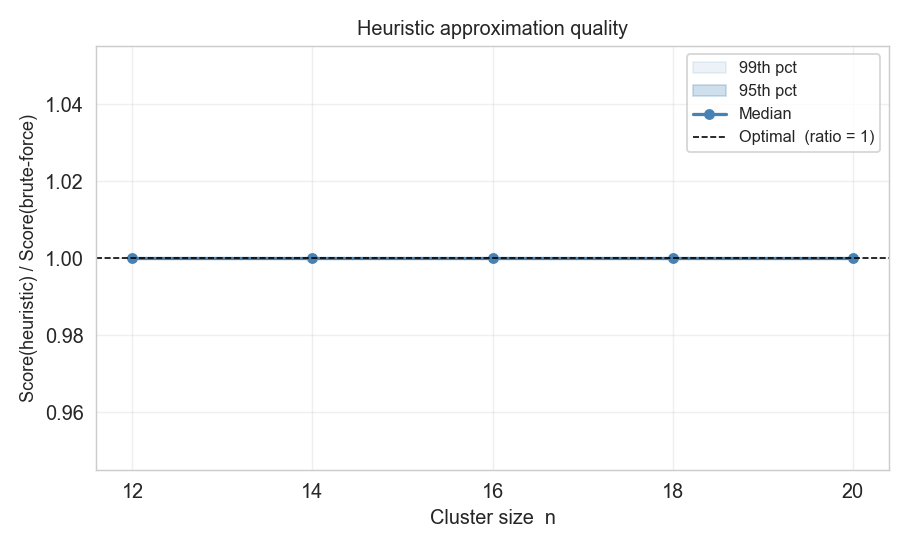

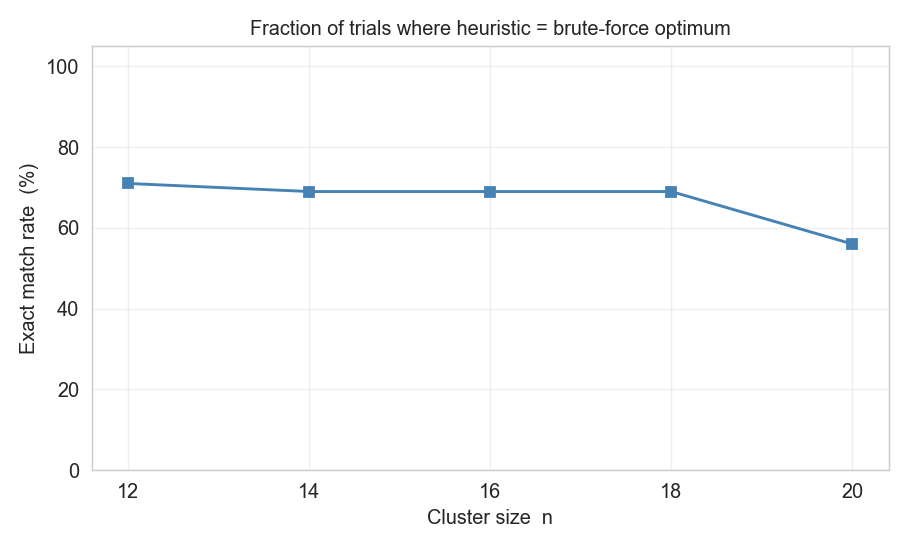

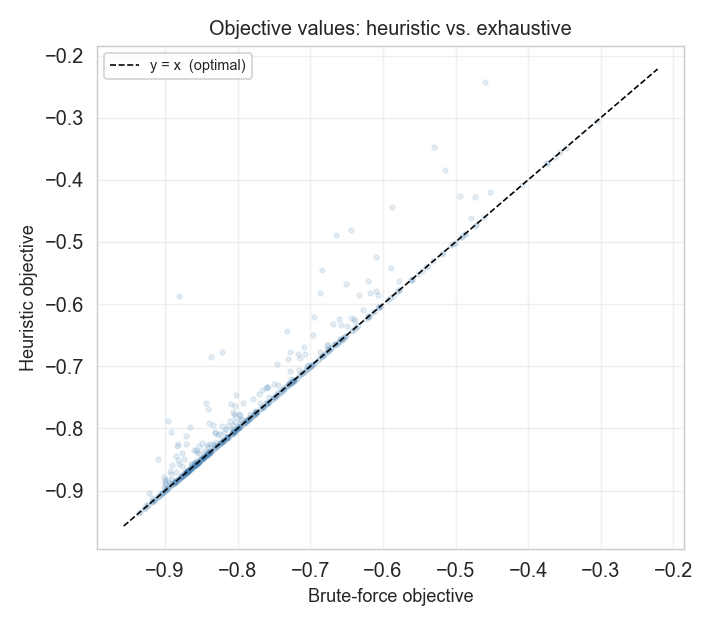

In [2]:
if RECOMPUTE:
    print('Running split comparison ...')
    run_script('run_split_comparison')
    print('Done.')

SPLIT = 'results/split_comparison'
print('=== Approximation quality summary ===')
show_df(f'{SPLIT}/summary.csv')
show_img(f'{SPLIT}/approx_ratio.png')
show_img(f'{SPLIT}/exact_match_rate.png')
show_img(f'{SPLIT}/score_scatter.png')

---
## 2  Base Backtest

Point-in-time S&P 500 backtest — full sample 2000–2024, top-100 constituents by market cap,
126-day lookback, 21-day rebalance, 0 bps transaction costs. Strategies: HMVA, HMVA-mv, MVO,
GMV, HRP, EW, SPY-100.

> **Note:** with `RECOMPUTE = True` this loads the 2.2 GB CRSP CSV — expect several minutes.

In [3]:
BASE = 'results/backtest/base'

if RECOMPUTE:
    print('Running base backtest (slow — reads 2.2 GB CSV) ...')
    run_script('run_backtest', ['--out', BASE])
    print('Done.')

print('=== Performance metrics ===')
show_df(f'{BASE}/metrics.csv', index_col=0)

=== Performance metrics ===


,AnnReturn,AnnVol,Sharpe,MaxDD,Calmar,Turnover,EffN,SharpeStab,Sortino,Omega,VaR95,CVaR95,Skew,Kurt,HitRate
HMVA,0.1087,0.1765,0.6157,-0.3108,0.3497,0.7816,4.2680,0.1108,0.8012,1.1342,-0.0160,-0.0254,-0.1516,16.2743,0.5397
HMVA-mv,0.0866,0.1492,0.5806,-0.3085,0.2808,0.6705,7.5216,0.1114,0.7447,1.1252,-0.0132,-0.0217,-0.3197,16.6765,0.5358
MVO,0.0469,0.3113,0.1507,-0.6963,0.0674,1.4896,1.6432,0.1149,0.1850,1.0629,-0.0280,-0.0465,-0.4370,22.3122,0.5239
GMV,0.0743,0.1396,0.5322,-0.3809,0.1950,0.8857,22.3955,0.1224,0.6804,1.1159,-0.0128,-0.0205,-0.0725,16.4261,0.5402
HRP,0.0787,0.1581,0.4982,-0.4350,0.1810,0.4002,62.2264,0.1115,0.6270,1.1124,-0.0148,-0.0238,-0.1340,13.0811,0.5436
EW,0.0663,0.1925,0.3446,-0.5542,0.1197,0.1005,100.0000,0.1124,0.4371,1.0853,-0.0185,-0.0291,-0.1550,10.5600,0.5409
SPY-100,0.0632,0.1929,0.3277,-0.5520,0.1145,0.0265,53.1052,0.1141,0.4195,1.0818,-0.0187,-0.0291,-0.0955,9.7070,0.5363


In [4]:
print('=== Statistical tests: HMVA vs comparators ===')
show_df(f'{BASE}/statistical_tests_hmva.csv')
print('=== Statistical tests: HMVA-mv vs comparators ===')
show_df(f'{BASE}/statistical_tests_hmva_mv.csv')

=== Statistical tests: HMVA vs comparators ===


,Strategy,Sharpe_diff,CI_lo_95,CI_hi_95,LW_p,LW_p_adj,LW_reject
0,HMVA-mv,0.0413,-0.1333,0.2116,0.6475,0.6475,False
1,MVO,0.3685,-0.0051,0.7655,0.0590,0.3080,False
2,GMV,0.0898,-0.1726,0.3566,0.5205,0.6246,False
3,HRP,0.1143,-0.1798,0.4041,0.4470,0.6246,False
4,EW,0.2429,-0.0869,0.5751,0.1540,0.3080,False
5,SPY-100,0.2587,-0.0723,0.5856,0.1330,0.3080,False


=== Statistical tests: HMVA-mv vs comparators ===


,Strategy,Sharpe_diff,CI_lo_95,CI_hi_95,LW_p,LW_p_adj,LW_reject
0,HMVA,-0.0413,-0.2116,0.1333,0.6475,0.6475,False
1,MVO,0.3272,-0.0752,0.7717,0.1270,0.3760,False
2,GMV,0.0485,-0.1371,0.2308,0.6030,0.6475,False
3,HRP,0.0730,-0.1567,0.3096,0.5410,0.6475,False
4,EW,0.2016,-0.0898,0.5074,0.1880,0.3760,False
5,SPY-100,0.2174,-0.0892,0.5287,0.1725,0.3760,False


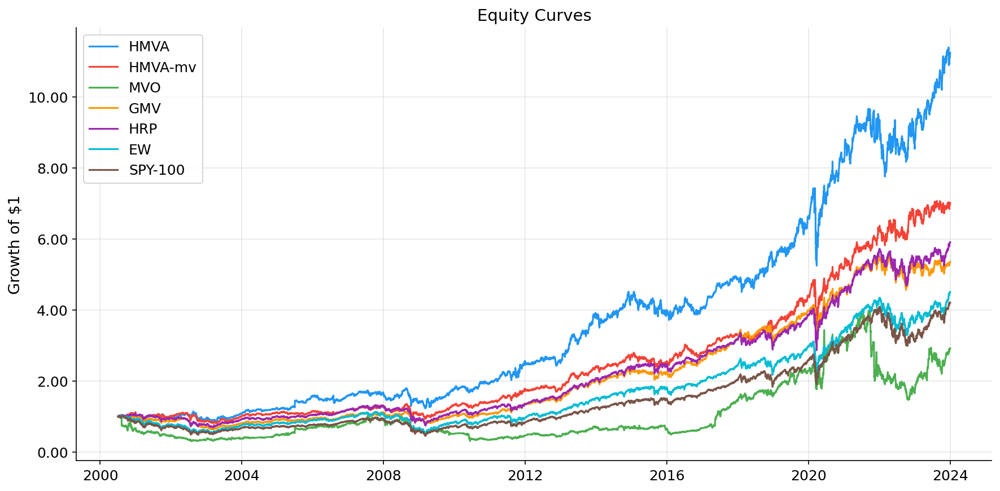

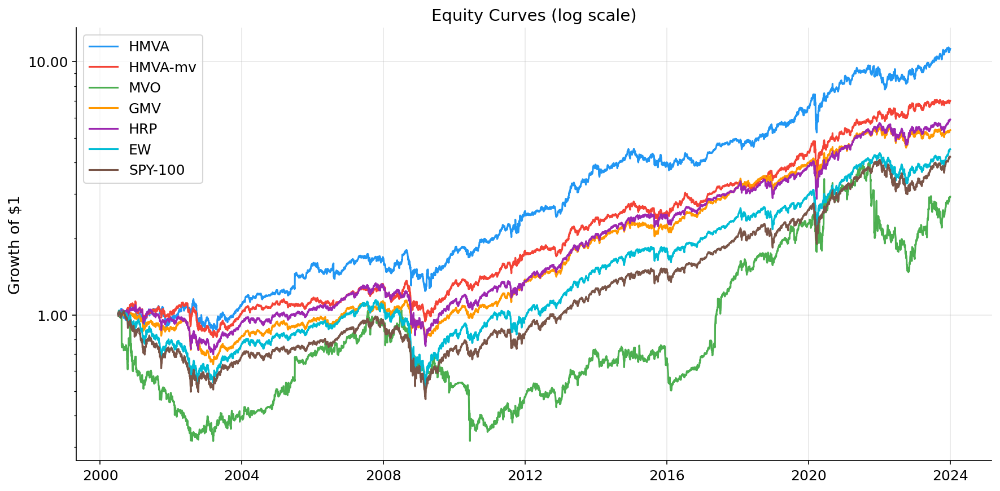

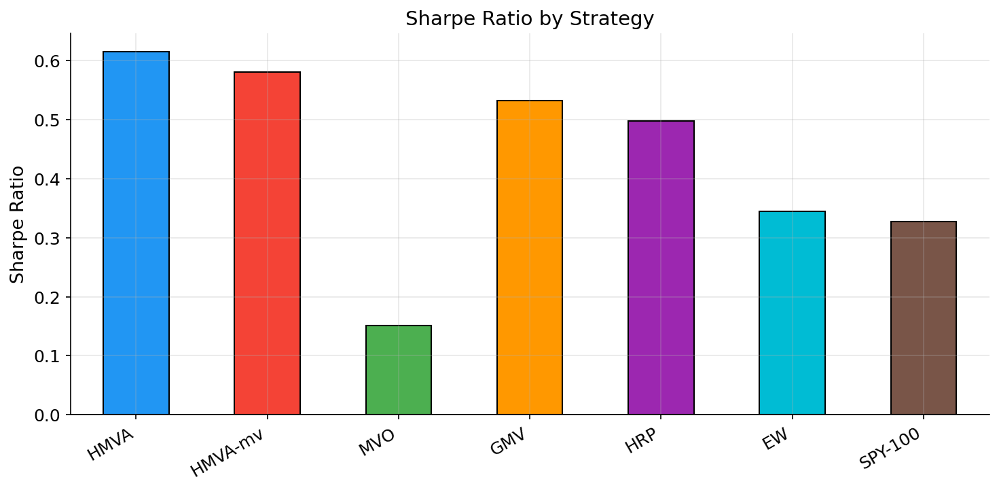

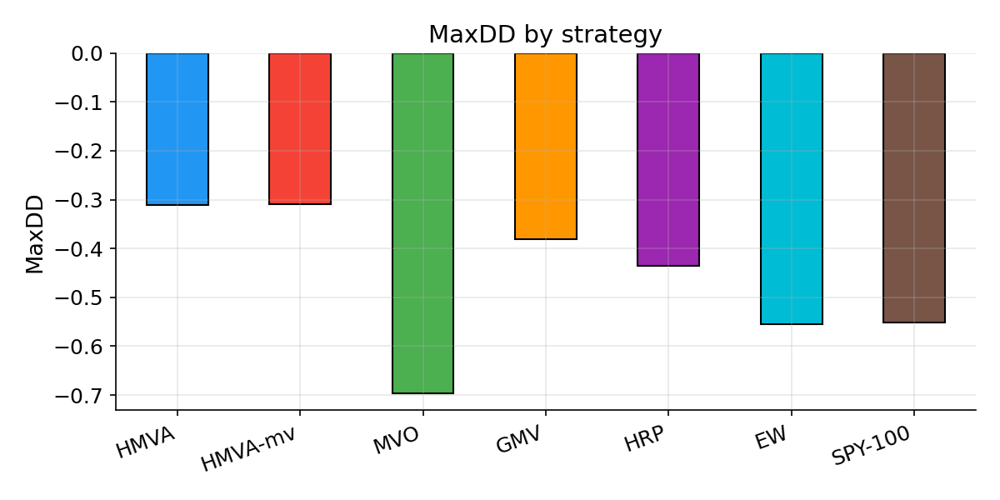

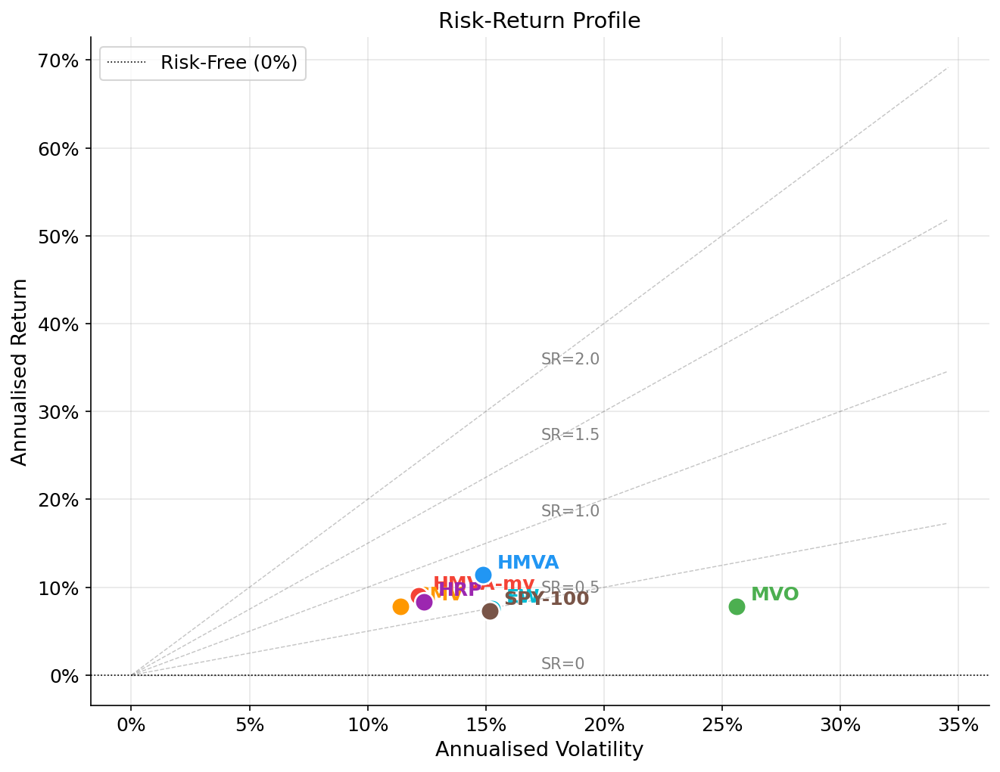

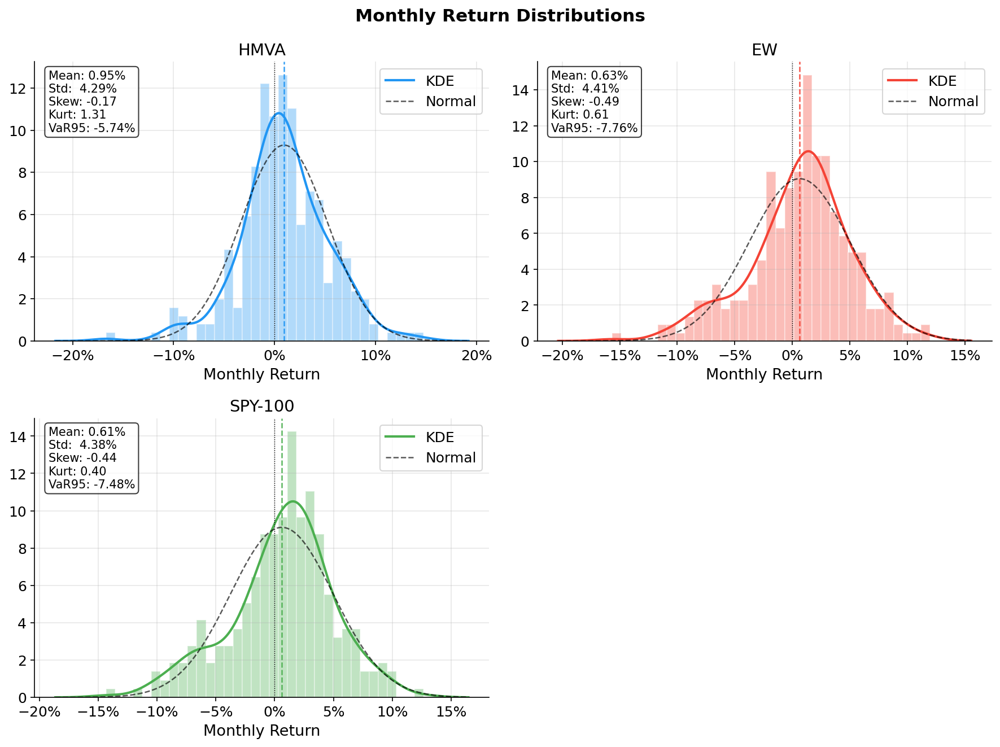

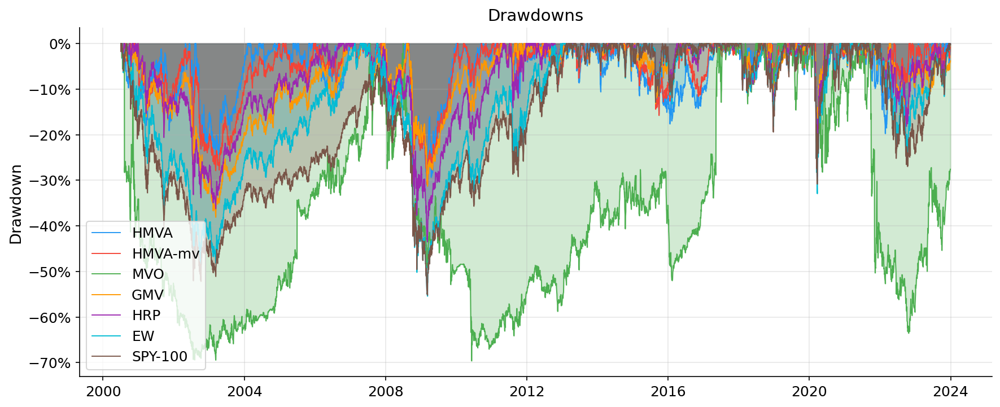

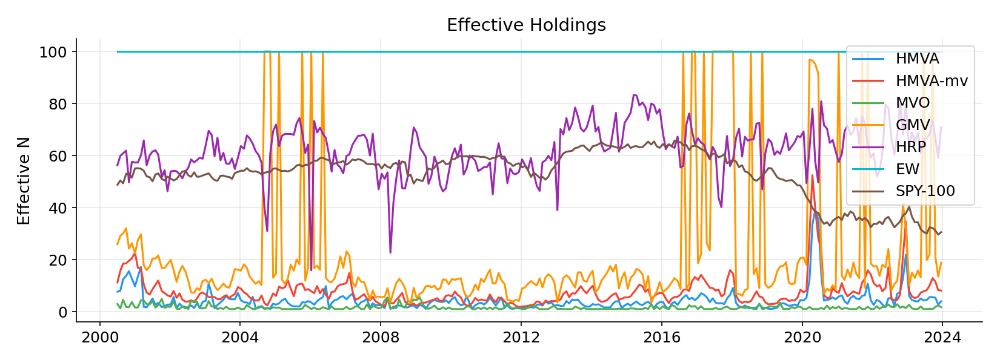

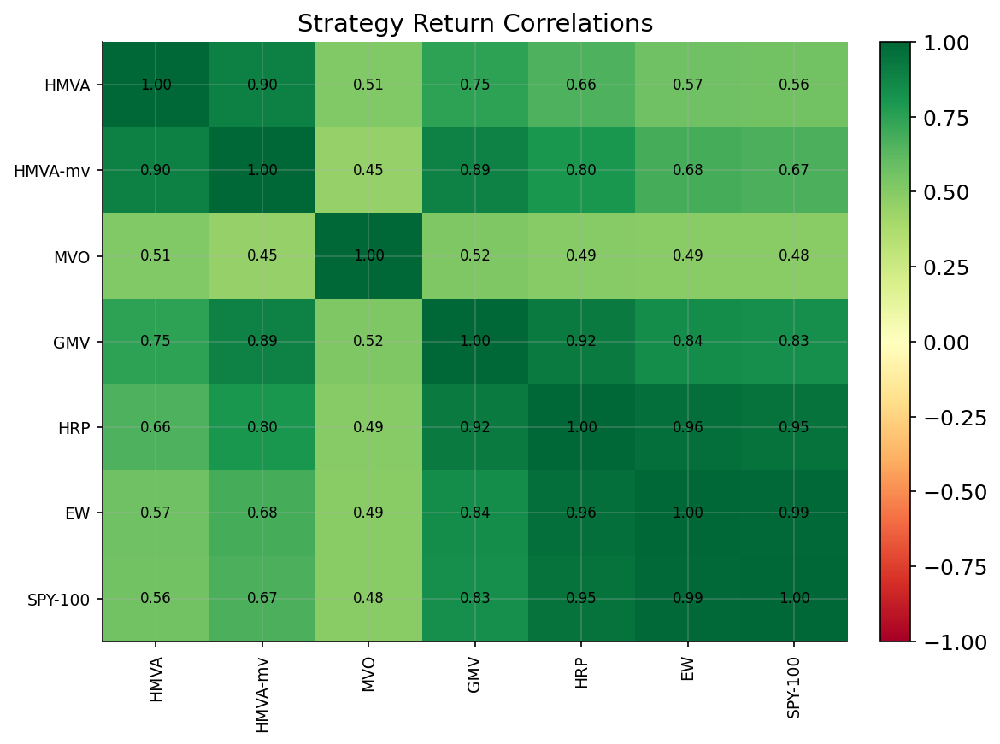

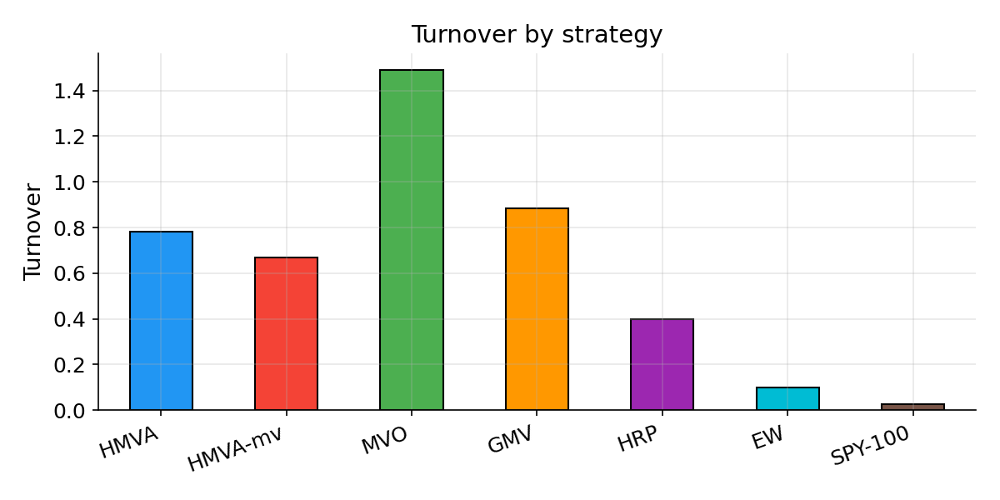

In [5]:
for img in [
    'equity_curves.png',
    'equity_curves_log.png',
    'sharpe_bars.png',
    'maxdd_bars.png',
    'risk_return.png',
    'return_dist.png',
    'drawdowns.png',
    'holdings_effective_n.png',
    'strategy_corr.png',
    'turnover_bars.png',
]:
    show_img(f'{BASE}/{img}')

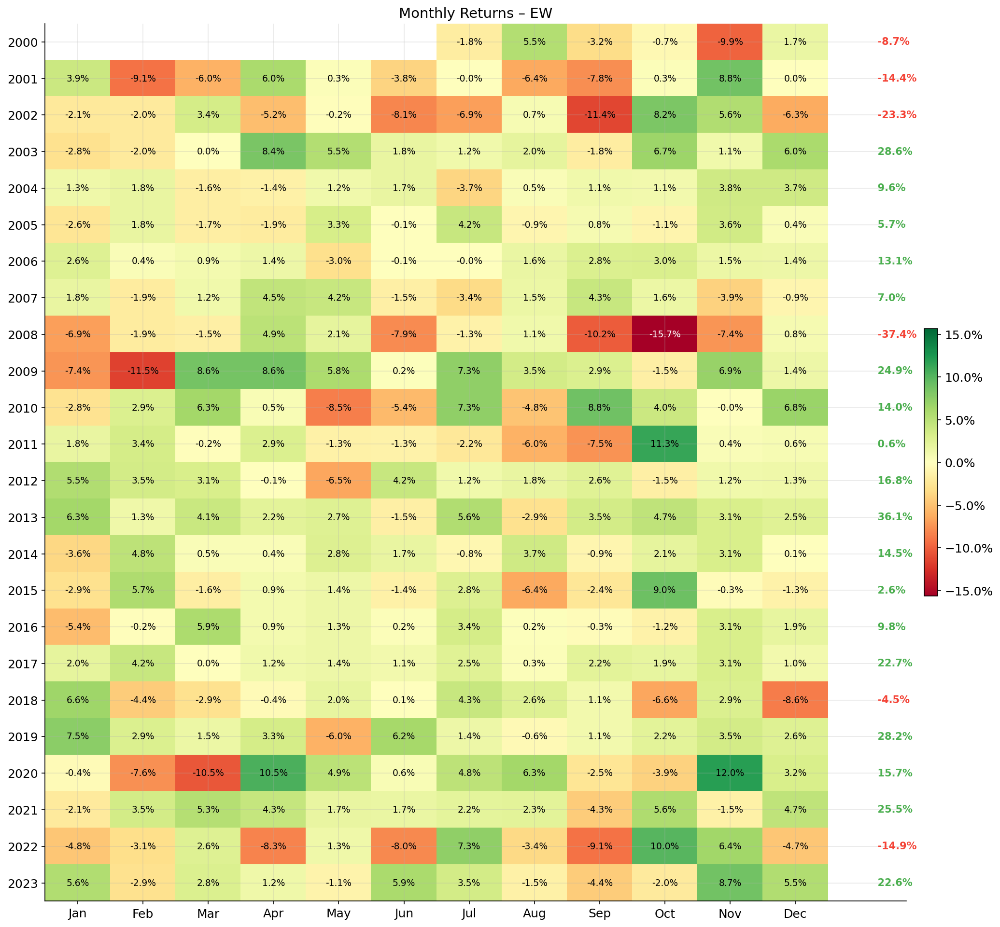

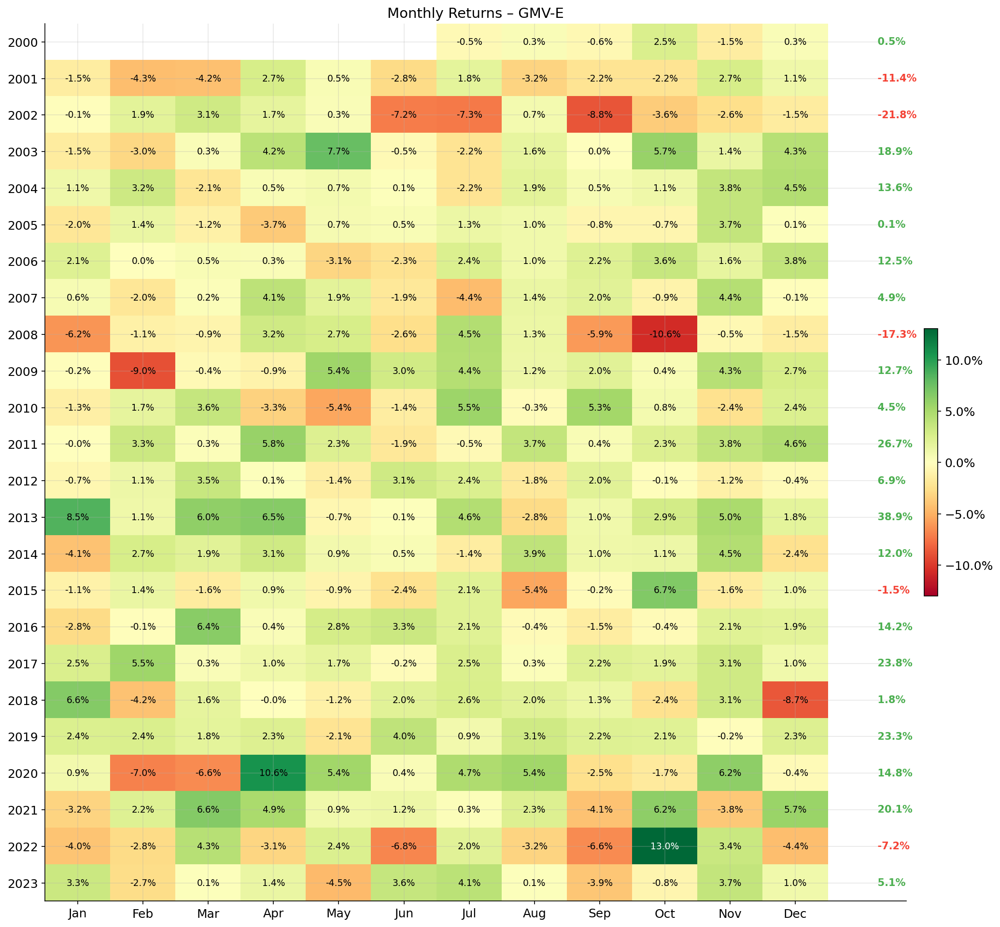

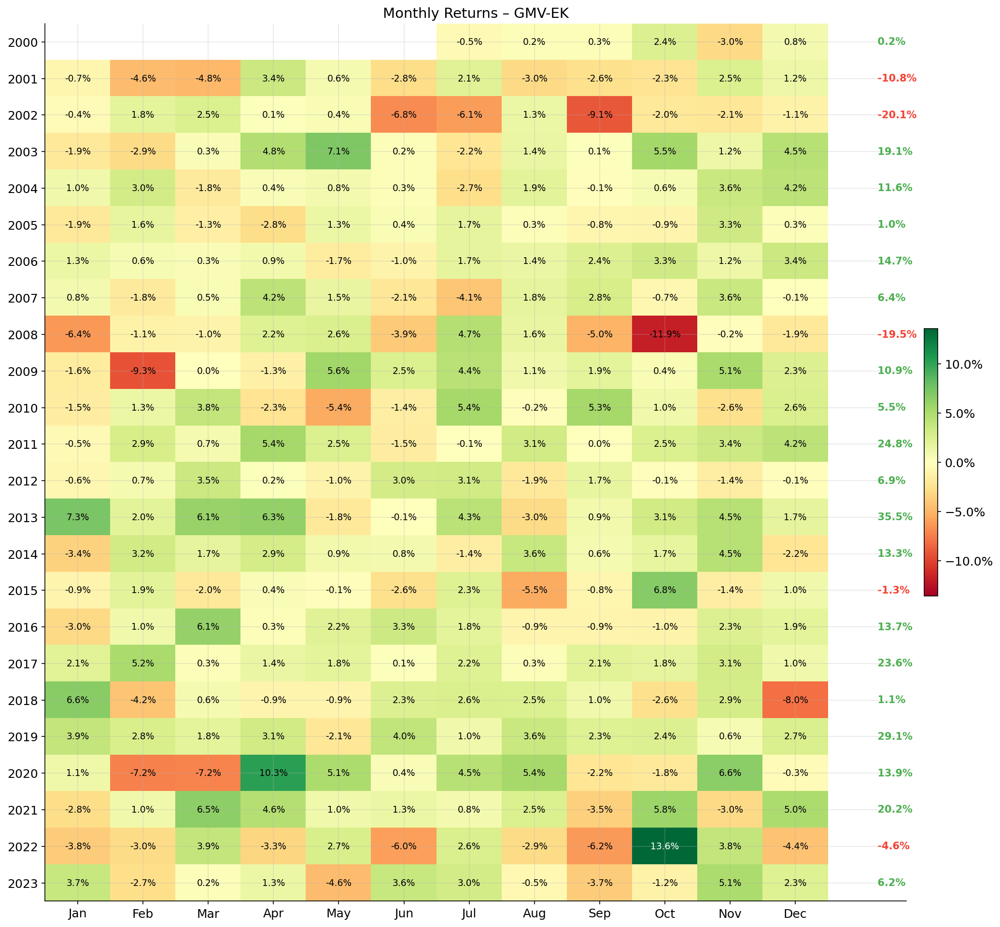

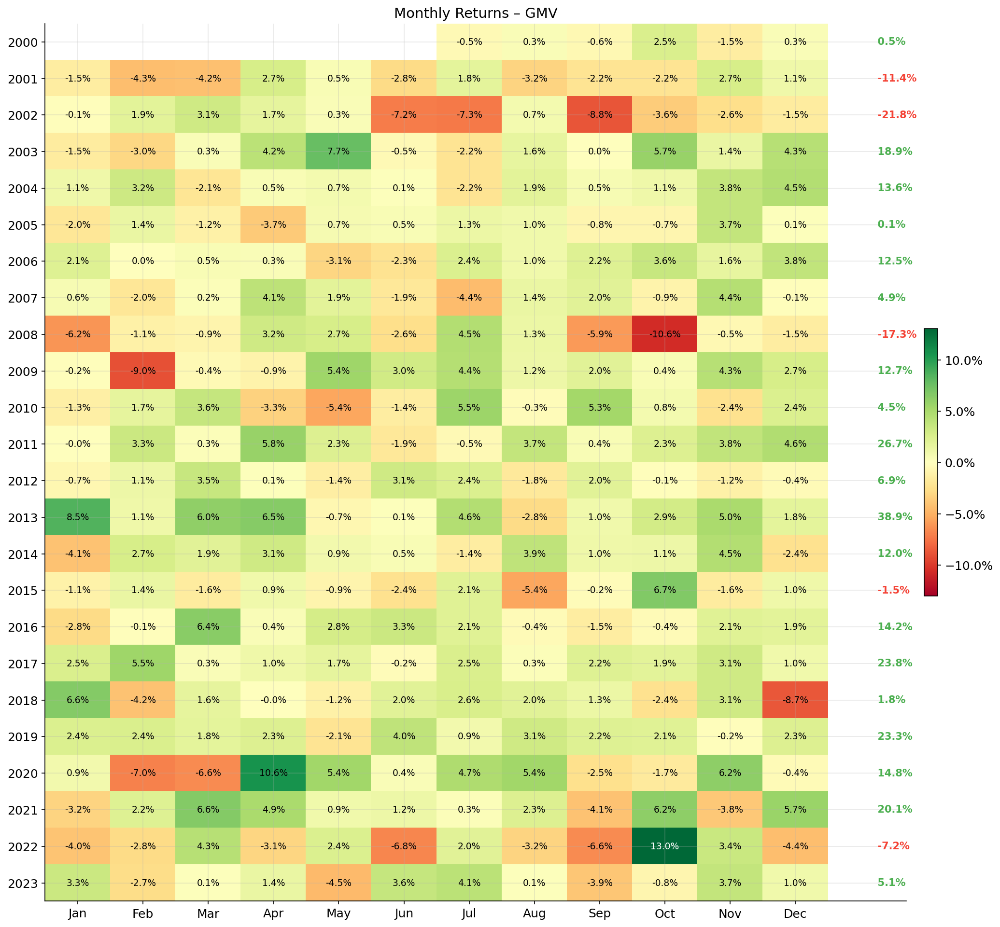

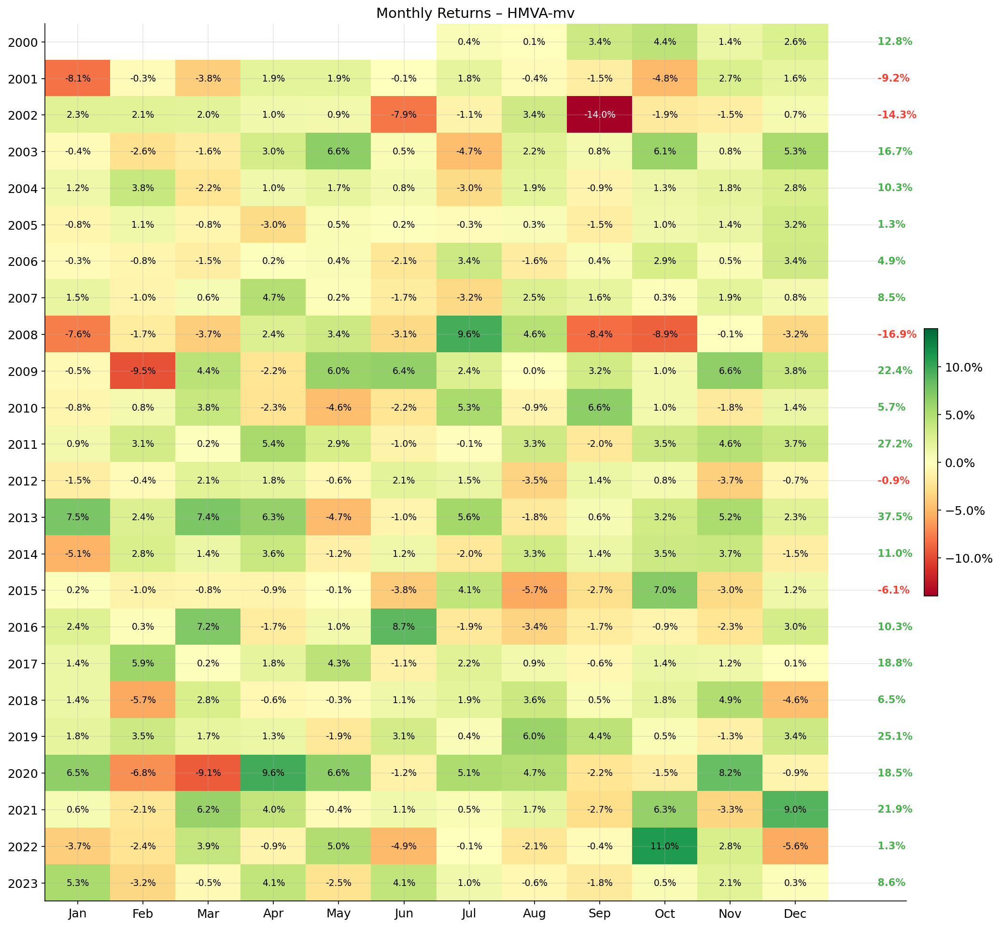

...

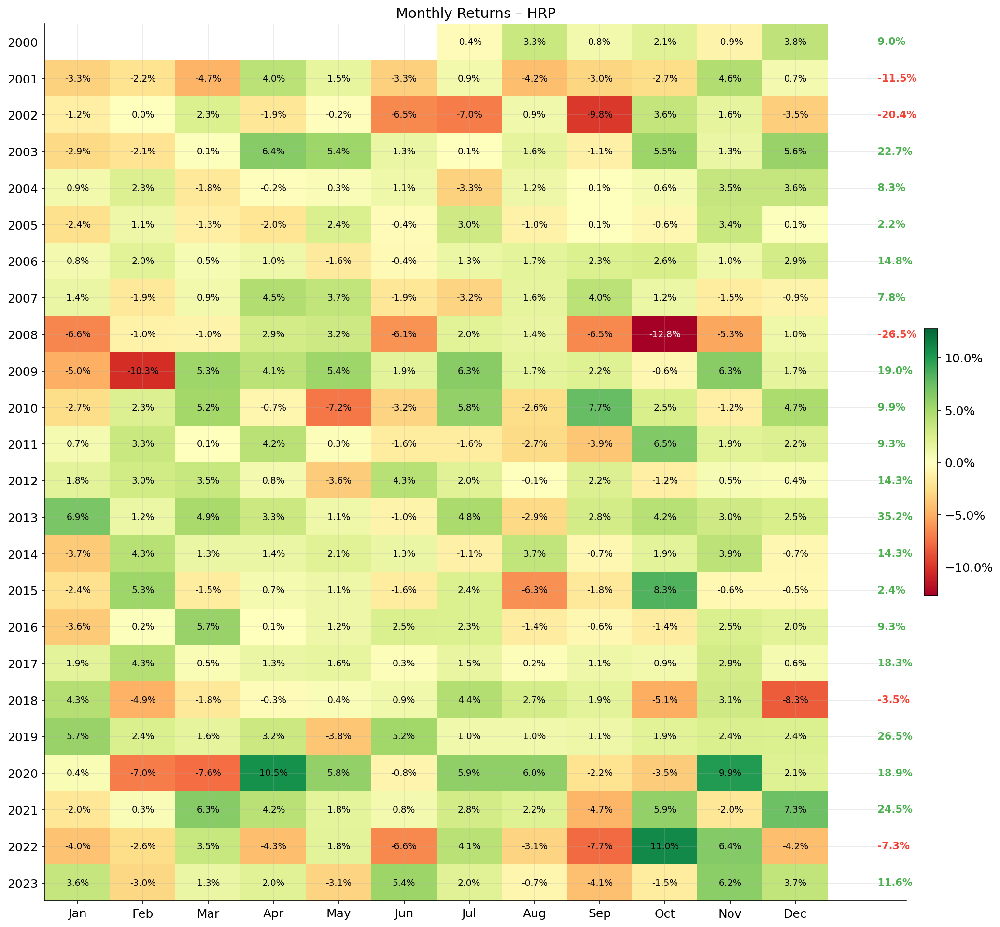

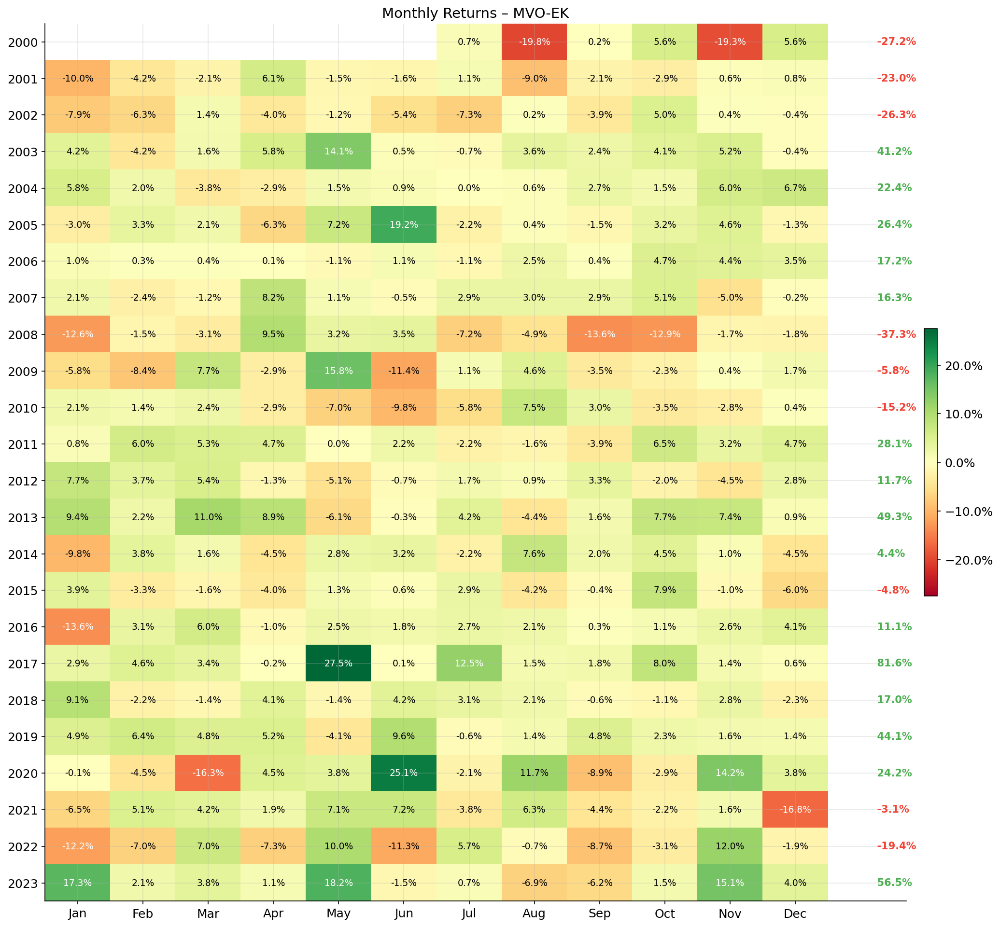

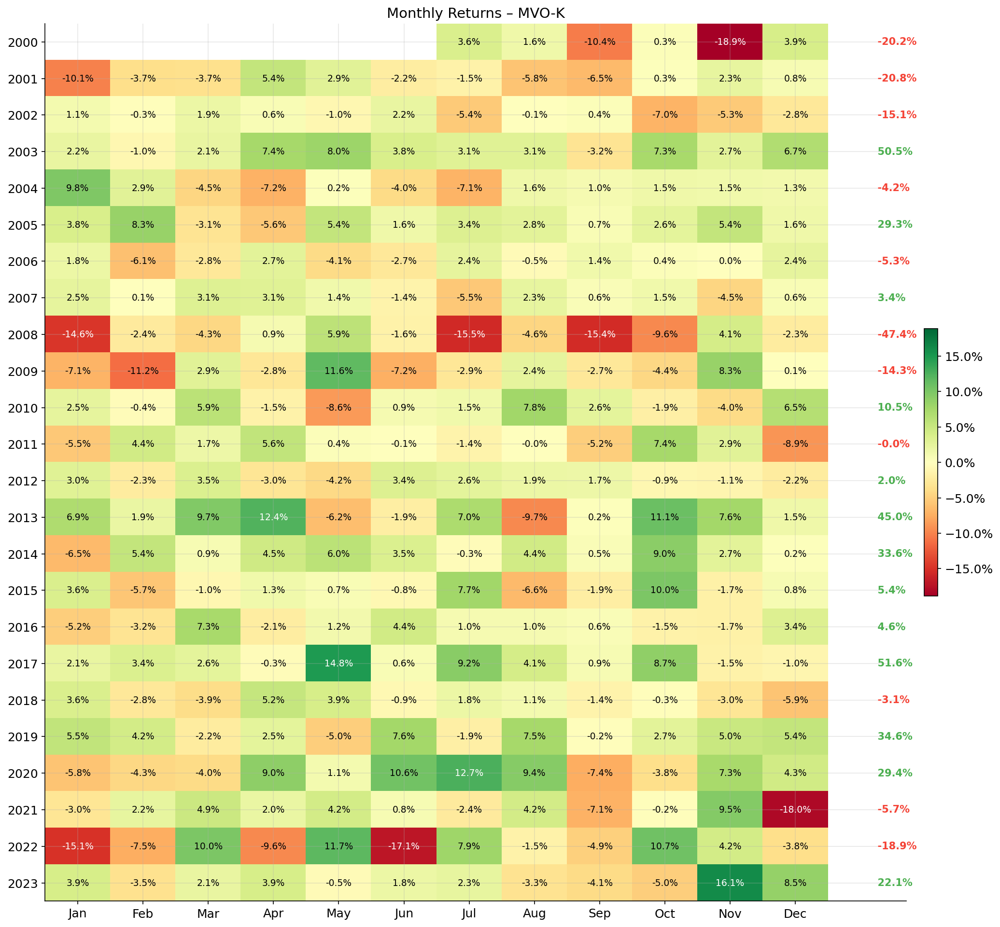

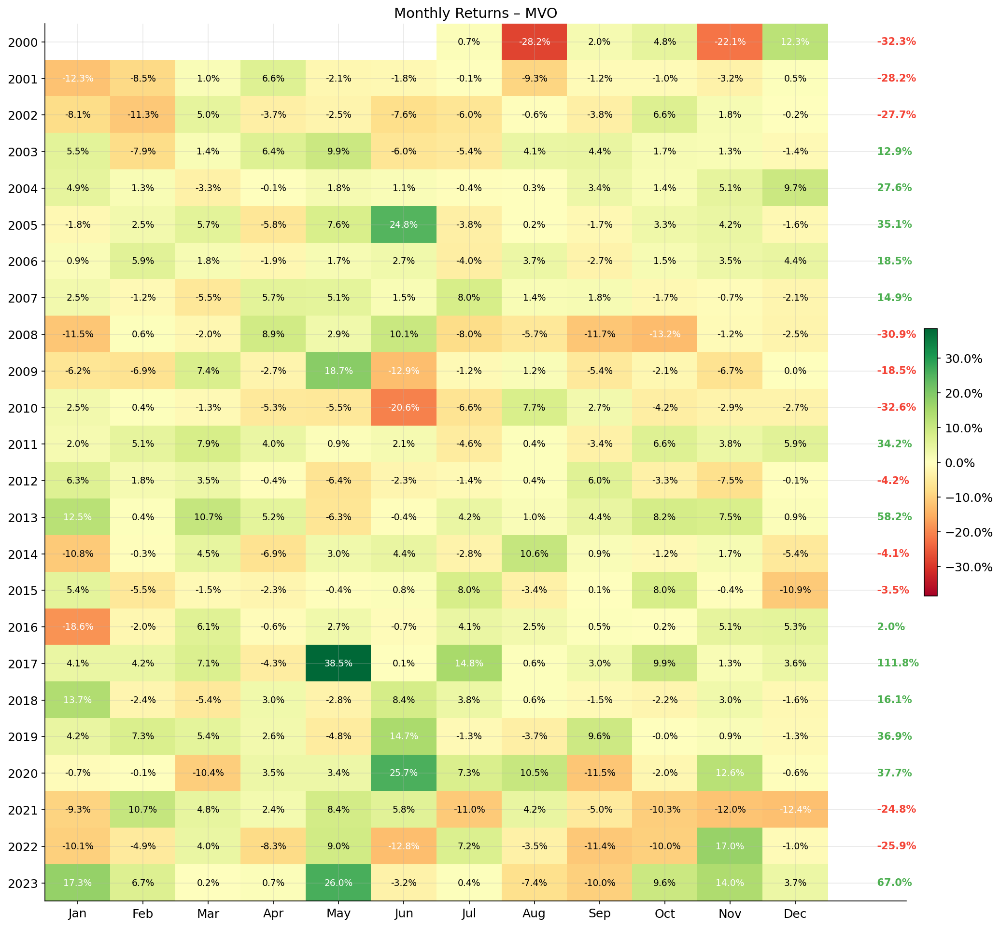

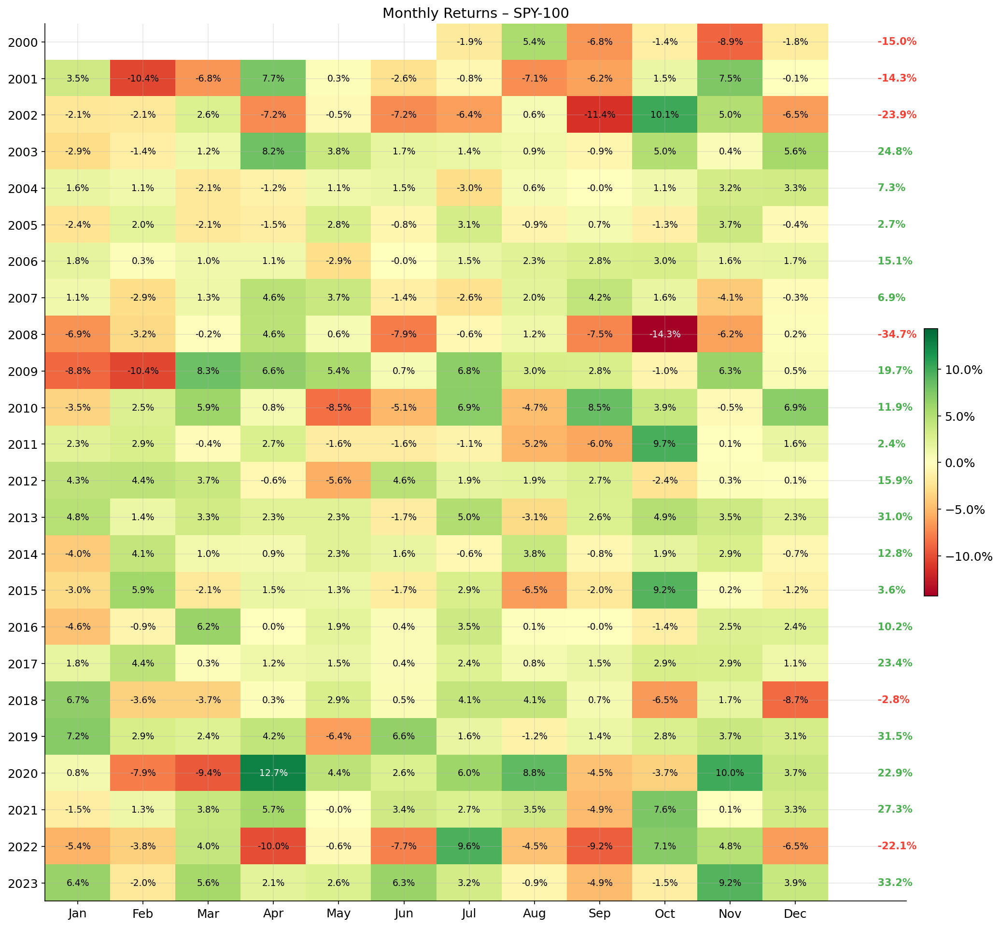

In [6]:
monthly = sorted(f for f in os.listdir(BASE) if f.startswith('monthly_') and f.endswith('.png'))
for img in monthly:
    show_img(f'{BASE}/{img}', width=700)

---
## 3  Component Ablation

Performance attribution: one-at-a-time removal of the return signal (Sharpe- vs vol-bisection),
the EWMA pseudo-return step, and the Kalman-filter weight smoother, at the base 126-day lookback.

=== Ablation metrics ===


,AnnReturn,AnnVol,Sharpe,MaxDD,Calmar,Turnover,EffN,SharpeStab,Sortino,Omega,VaR95,CVaR95,Skew,Kurt,HitRate
HMVA,0.1087,0.1765,0.6157,-0.3108,0.3497,0.7816,4.2680,0.1108,0.8012,1.1342,-0.0160,-0.0254,-0.1516,16.2743,0.5397
HMVA-noK,0.1058,0.1988,0.5324,-0.3228,0.3278,1.3337,2.5493,0.1128,0.6995,1.1214,-0.0177,-0.0288,0.0514,19.0814,0.5290
HMVA-noE,0.0942,0.1746,0.5396,-0.3097,0.3042,0.5216,3.5478,0.1163,0.7017,1.1200,-0.0156,-0.0256,-0.2409,11.8558,0.5346
HMVA-noK-noE,0.1003,0.1927,0.5203,-0.3091,0.3243,0.8994,2.2863,0.1127,0.6824,1.1190,-0.0170,-0.0281,-0.0494,13.1045,0.5256
HMVA-mv,0.0866,0.1492,0.5806,-0.3085,0.2808,0.6705,7.5216,0.1114,0.7447,1.1252,-0.0132,-0.0217,-0.3197,16.6765,0.5358
HMVA-mv-noK,0.0862,0.1561,0.5525,-0.3228,0.2671,1.0851,5.5973,0.1116,0.7092,1.1199,-0.0143,-0.0230,-0.4412,14.0158,0.5317
HMVA-mv-noE,0.0815,0.1545,0.5274,-0.3575,0.2279,0.4587,6.2167,0.1111,0.6768,1.1156,-0.0135,-0.0226,-0.2672,15.9065,0.5370
HMVA-mv-noK-noE,0.0900,0.1571,0.5727,-0.3450,0.2607,0.6767,5.2293,0.1114,0.7368,1.1237,-0.0138,-0.0231,-0.4206,13.3988,0.5300


=== LW Sharpe tests vs HMVA ===


,sharpe_diff,lw_p,ci_lo_95,ci_hi_95,lw_p_adj,reject
strategy,,,,,,
HMVA-noK,0.0674,0.2450,-0.0446,0.1890,0.7215,False
HMVA-noE,0.0698,0.5730,-0.1730,0.3135,0.7215,False
HMVA-noK-noE,0.0807,0.5705,-0.1890,0.3536,0.7215,False
HMVA-mv,0.0413,0.6475,-0.1333,0.2116,0.7215,False
HMVA-mv-noK,0.0647,0.4675,-0.1088,0.2416,0.7215,False
HMVA-mv-noE,0.0885,0.4705,-0.1486,0.3298,0.7215,False
HMVA-mv-noK-noE,0.0458,0.7215,-0.2055,0.2985,0.7215,False


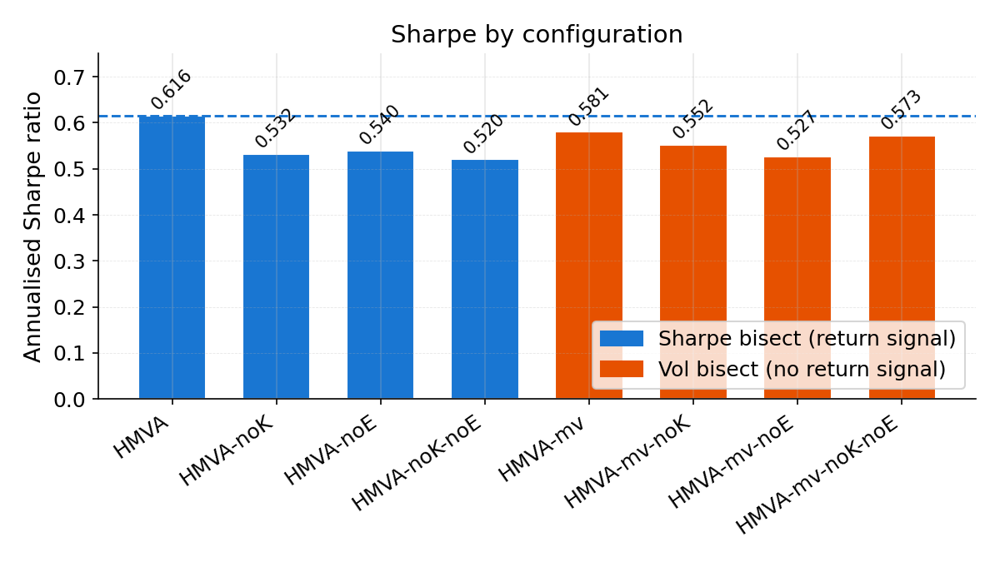

In [7]:
ABLATION = 'results/ablation'

if RECOMPUTE:
    print('Running ablation study ...')
    run_script('run_ablation', [])
    print('Done.')

print('=== Ablation metrics ===')
show_df(f'{ABLATION}/ablation_metrics.csv', index_col=0)
print('=== LW Sharpe tests vs HMVA ===')
show_df(f'{ABLATION}/ablation_tests.csv', index_col=0)
show_img(f'{ABLATION}/ablation_sharpe_bars.png')

---
## 4  Archived Backtest Variants

Earlier backtest configurations kept for reference (`mean`, `var`, `benchmarks` subfolders under
`results/backtest/`). These were produced by prior iterations of `run_backtest.py` / strategy
sets and are **not** regenerated by `RECOMPUTE` — they're shown here read-only for context.

In [8]:
BACKTEST_DIR = 'results/backtest'
archived = sorted(
    d for d in os.listdir(BACKTEST_DIR)
    if d != 'base' and os.path.isdir(f'{BACKTEST_DIR}/{d}')
)

for sub in archived:
    subdir = f'{BACKTEST_DIR}/{sub}'
    print(f'\n=== {sub} — performance metrics ===')
    show_df(f'{subdir}/metrics.csv', index_col=0)


=== benchmarks — performance metrics ===


,AnnReturn,AnnVol,Sharpe,MaxDD,Calmar,Turnover,EffN,SharpeStab,Sortino,Omega,VaR95,CVaR95,Skew,Kurt,HitRate
MVO-EK,0.0799,0.1949,0.4100,-0.3411,0.2343,0.7928,3.5870,0.1302,0.5460,1.0921,-0.0188,-0.0290,-0.3742,5.5291,0.5250
MVO-K,0.1257,0.1955,0.6429,-0.2995,0.4198,0.5819,4.6386,0.1211,0.9001,1.1383,-0.0180,-0.0268,0.3398,13.5921,0.5225
MVO-E,0.1180,0.2457,0.4803,-0.3733,0.3163,1.5051,1.6448,0.1192,0.6669,1.1088,-0.0234,-0.0341,-0.4330,10.1205,0.5171
MVO,0.1241,0.2699,0.4596,-0.4919,0.2522,1.4180,1.7974,0.1230,0.6668,1.1147,-0.0237,-0.0358,1.2527,26.5484,0.5112
GMV-EK,0.1461,0.1136,1.2859,-0.1306,1.1186,0.5253,20.7286,0.1186,1.8292,1.2429,-0.0105,-0.0157,-0.2807,4.5134,0.5358
GMV-K,0.1418,0.1136,1.2481,-0.1266,1.1202,0.3399,22.7437,0.1159,1.7713,1.2371,-0.0106,-0.0157,-0.2554,5.2158,0.5316
GMV-E,0.1538,0.1155,1.3319,-0.1338,1.1491,0.8751,16.8635,0.1236,1.9021,1.2499,-0.0109,-0.0160,-0.2945,3.7814,0.5337
GMV,0.1375,0.1135,1.2111,-0.1267,1.0854,0.5197,20.7735,0.1195,1.7323,1.2289,-0.0108,-0.0157,-0.2392,4.4338,0.5316
HRP-EK,0.1772,0.1271,1.3939,-0.1679,1.0557,0.2448,69.8408,0.1157,1.9271,1.2686,-0.0120,-0.0179,-0.3114,5.7358,0.5371
HRP-K,0.1725,0.1287,1.3403,-0.1749,0.9863,0.1659,73.7087,0.1128,1.8483,1.2592,-0.0121,-0.0181,-0.3062,6.1481,0.5412



=== mean — performance metrics ===


,AnnReturn,AnnVol,Sharpe,MaxDD,Calmar,Turnover,EffN,SharpeStab,Sortino,Omega,VaR95,CVaR95,Skew,Kurt,HitRate
HMVA,0.1087,0.1765,0.6157,-0.3108,0.3497,0.7816,4.2680,0.1108,0.8012,1.1342,-0.0160,-0.0254,-0.1516,16.2743,0.5397
MVO,0.0469,0.3113,0.1507,-0.6963,0.0674,1.4896,1.6432,0.1149,0.1850,1.0629,-0.0280,-0.0465,-0.4370,22.3122,0.5239
EW,0.0663,0.1925,0.3446,-0.5542,0.1197,0.1005,100.0000,0.1124,0.4371,1.0853,-0.0185,-0.0291,-0.1550,10.5600,0.5409
SPY-100,0.0632,0.1929,0.3277,-0.5520,0.1145,0.0265,53.1052,0.1141,0.4195,1.0818,-0.0187,-0.0291,-0.0955,9.7070,0.5363



=== var — performance metrics ===


,AnnReturn,AnnVol,Sharpe,MaxDD,Calmar,Turnover,EffN,SharpeStab,Sortino,Omega,VaR95,CVaR95,Skew,Kurt,HitRate
HMVA-mv,0.0866,0.1492,0.5806,-0.3085,0.2808,0.6705,7.5216,0.1114,0.7447,1.1252,-0.0132,-0.0217,-0.3197,16.6765,0.5358
GMV,0.0743,0.1396,0.5322,-0.3809,0.1950,0.8857,22.3955,0.1224,0.6804,1.1159,-0.0128,-0.0205,-0.0725,16.4261,0.5402
HRP,0.0787,0.1581,0.4982,-0.4350,0.1810,0.4002,62.2264,0.1115,0.6270,1.1124,-0.0148,-0.0238,-0.1340,13.0811,0.5436
EW,0.0663,0.1925,0.3446,-0.5542,0.1197,0.1005,100.0000,0.1124,0.4371,1.0853,-0.0185,-0.0291,-0.1550,10.5600,0.5409
SPY-100,0.0632,0.1929,0.3277,-0.5520,0.1145,0.0265,53.1052,0.1141,0.4195,1.0818,-0.0187,-0.0291,-0.0955,9.7070,0.5363



--- benchmarks ---


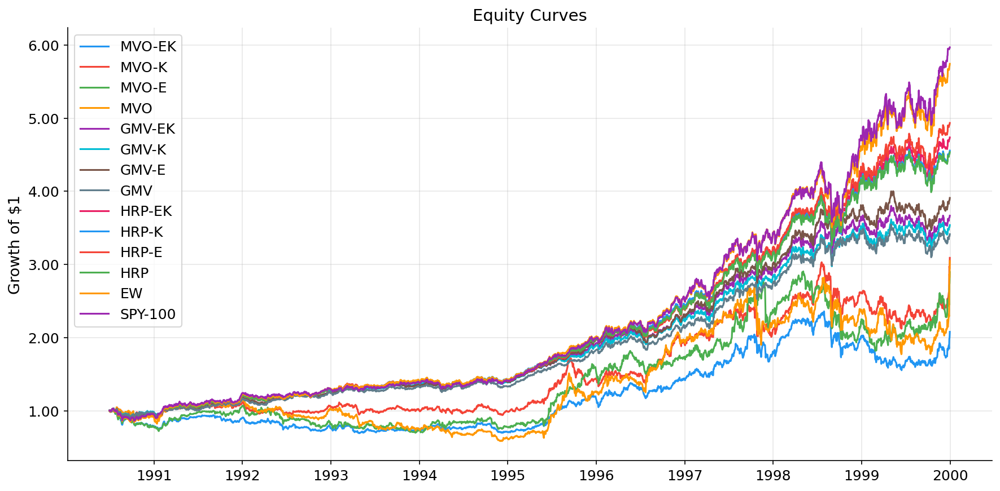

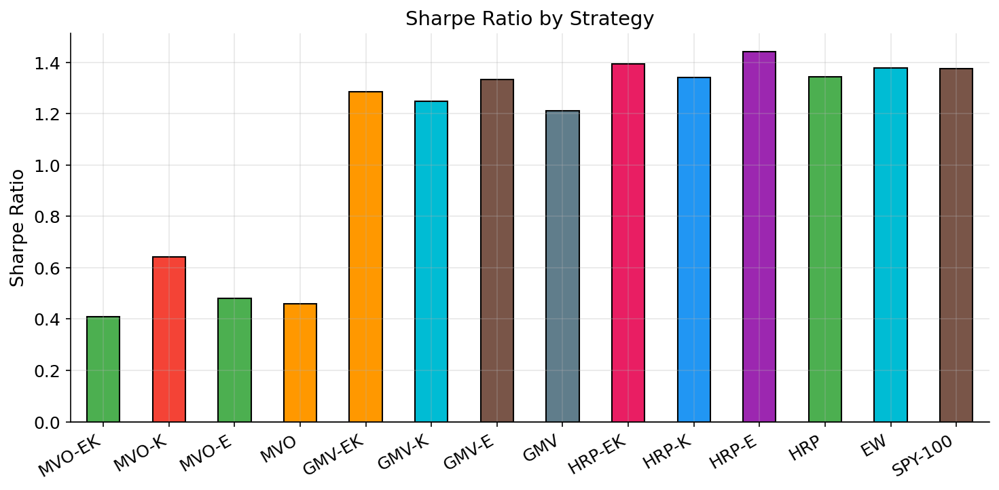

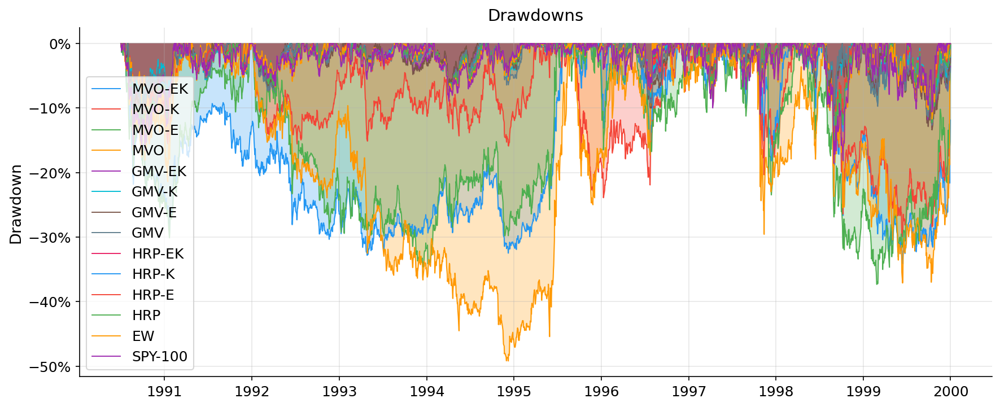


--- mean ---


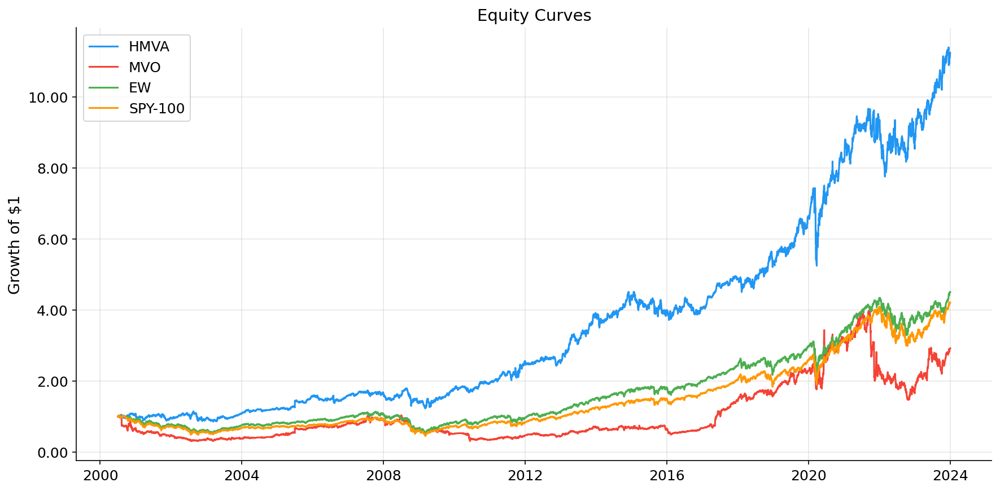

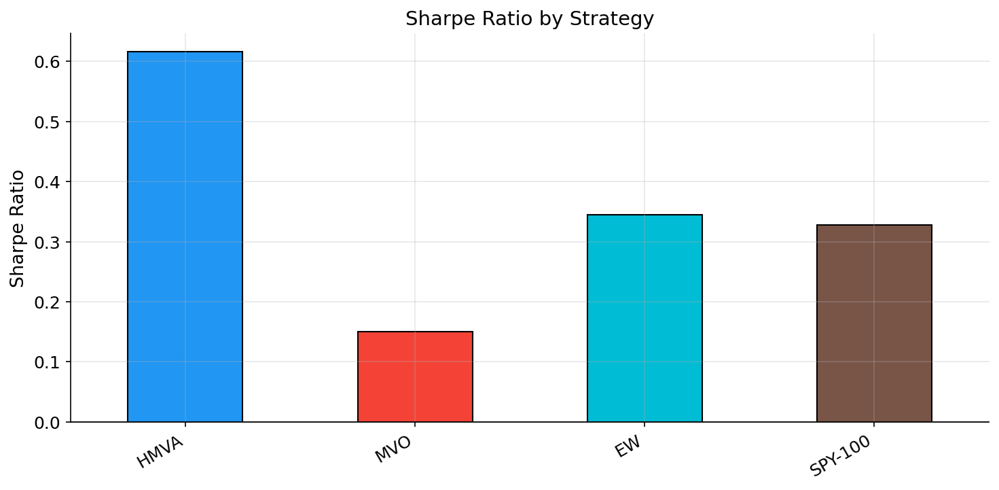

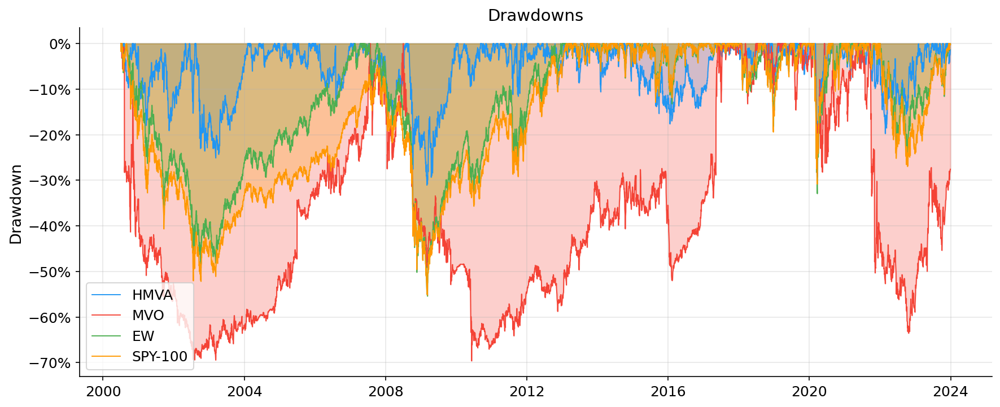


--- var ---


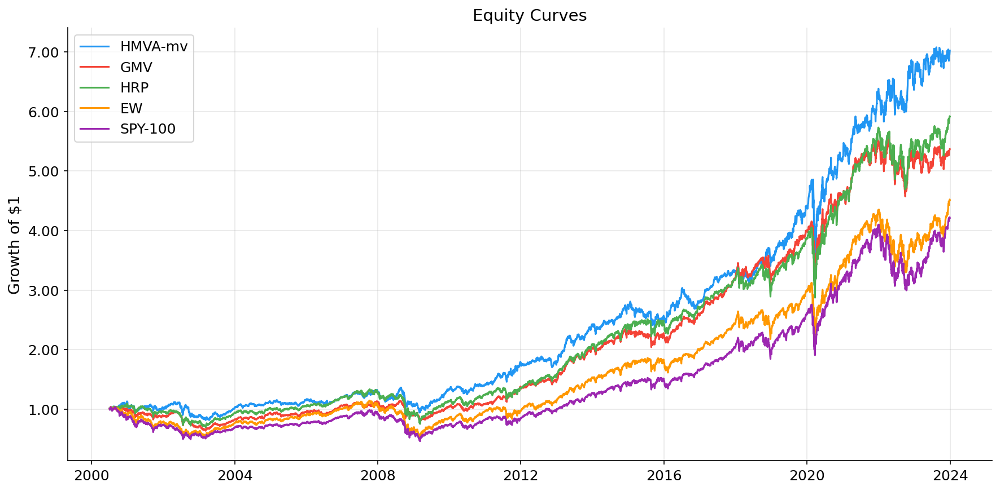

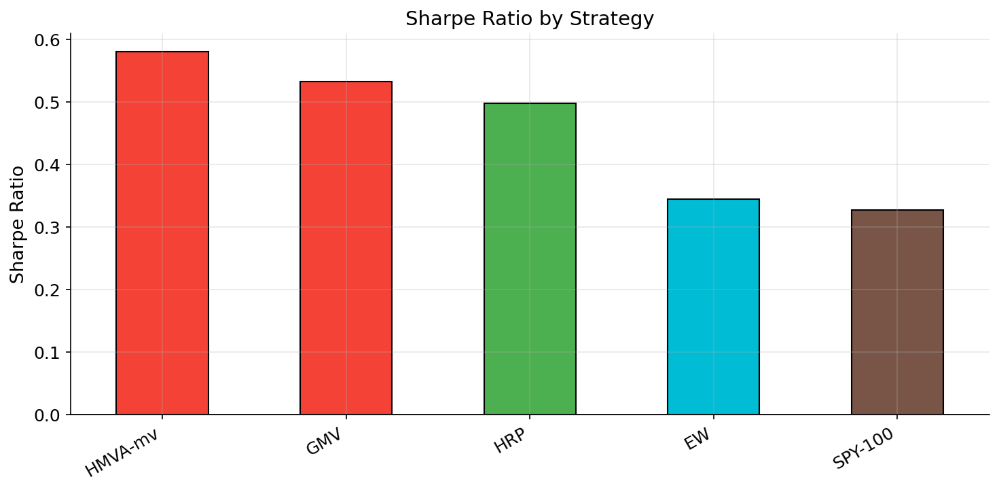

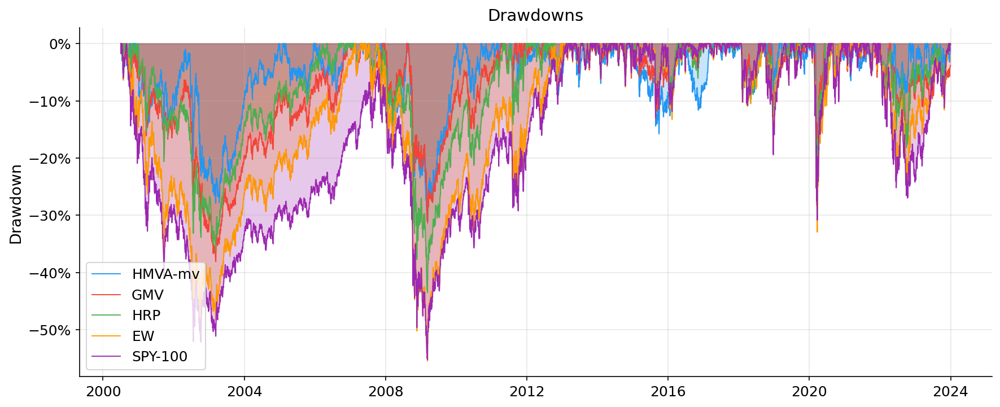

In [9]:
for sub in archived:
    subdir = f'{BACKTEST_DIR}/{sub}'
    print(f'\n--- {sub} ---')
    for img in ['equity_curves.png', 'sharpe_bars.png', 'drawdowns.png']:
        show_img(f'{subdir}/{img}', width=700)

---
## 5  Cost Robustness

Sensitivity of active strategies to transaction costs (0, 2, 5, 10, 20, 30 bps) at 126-day
lookback, measured as ΔSharpe / ΔSortino vs the EW and SPY-100 benchmarks.

In [10]:
COST = 'results/cost_robustness'

if RECOMPUTE:
    print('Running cost robustness sweep ...')
    run_script('run_cost_robustness', [])
    print('Done.')

print('=== Active strategies — robustness summary ===')
show_df(f'{COST}/robustness_summary.csv', index_col=0)

=== Active strategies — robustness summary ===


,mean_dSharpe_EW,median_dSharpe_EW,pct_pos_EW,mean_dSortino_EW,mean_dSharpe_SPYK,mean_dSortino_SPYK,mean_sharpe,mean_sortino,mean_calmar,mean_max_dd,mean_var95,mean_hit_rate,mean_turnover,n_cells
strategy,,,,,,,,,,,,,,
GMV,0.1045,0.1314,0.8333,0.1372,0.1159,0.1479,0.4416,0.5649,0.1564,-0.3982,-0.0129,0.5372,0.8857,6
HMVA,0.2132,0.2320,1.0000,0.2886,0.2246,0.2993,0.5504,0.7162,0.3087,-0.3155,-0.0161,0.5375,0.7816,6
HMVA-mv,0.1785,0.1972,1.0000,0.2334,0.1899,0.2441,0.5156,0.6611,0.2464,-0.3130,-0.0133,0.5344,0.6705,6
HRP,0.1246,0.1341,1.0000,0.1537,0.1360,0.1643,0.4618,0.5813,0.1663,-0.4393,-0.0149,0.5420,0.4002,6
MVO,-0.2524,-0.2336,0.0000,-0.3235,-0.2409,-0.3129,0.0848,0.1041,0.0371,-0.7450,-0.0280,0.5212,1.4896,6


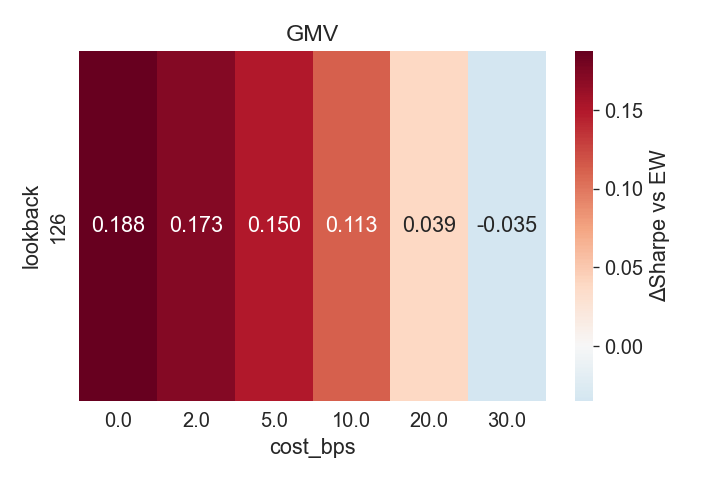

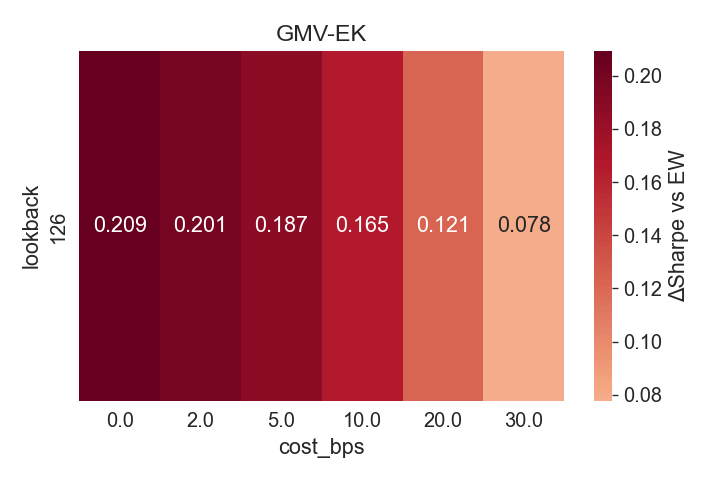

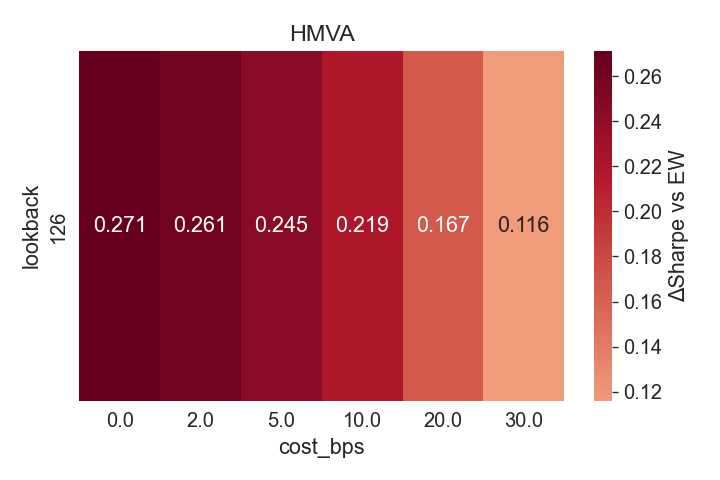

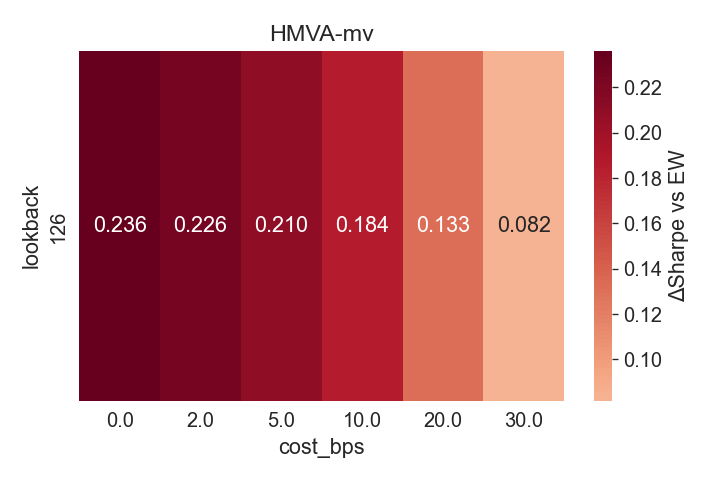

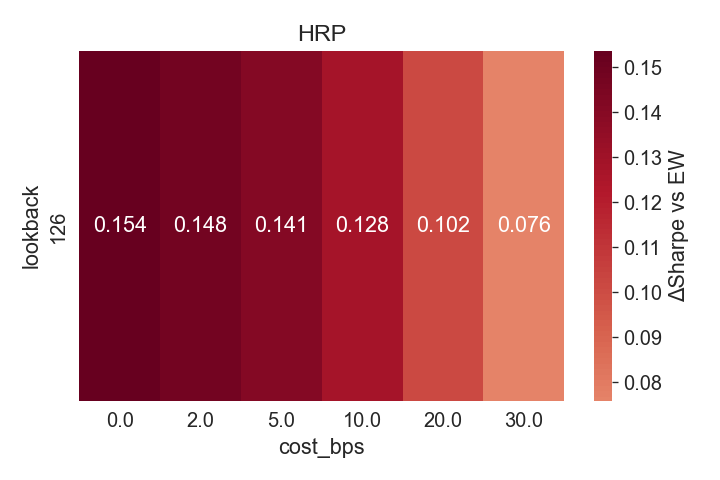

...

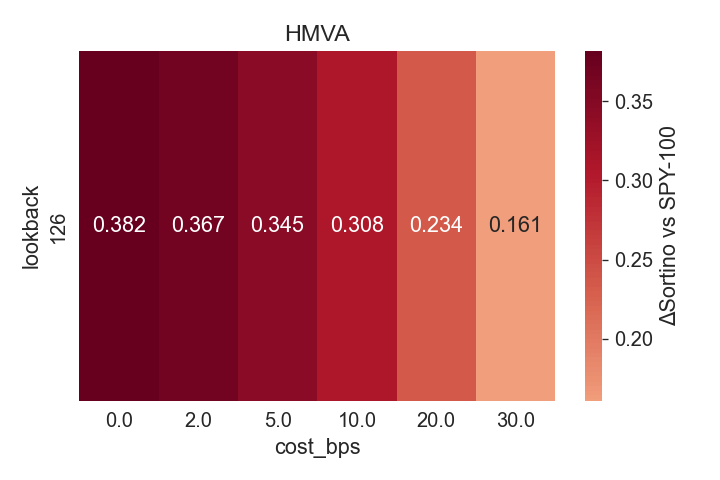

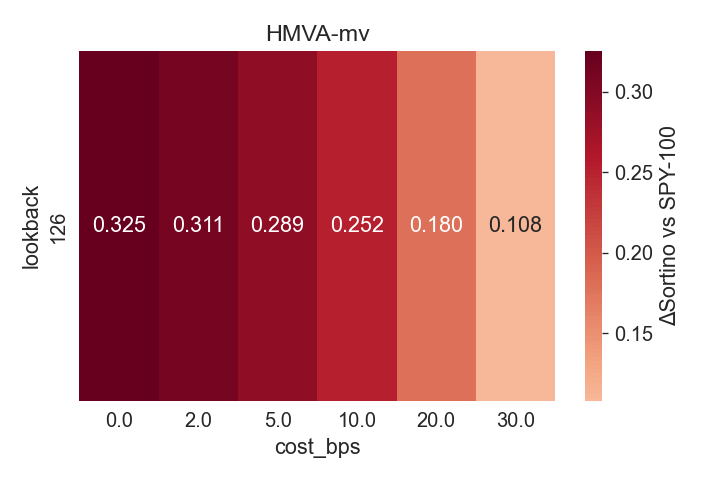

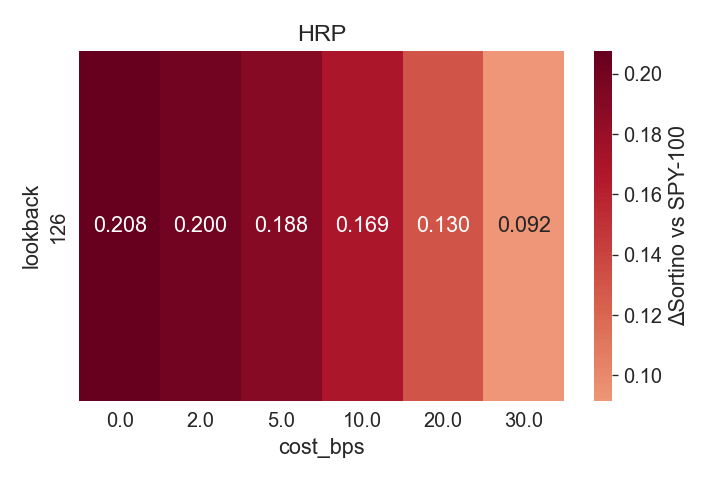

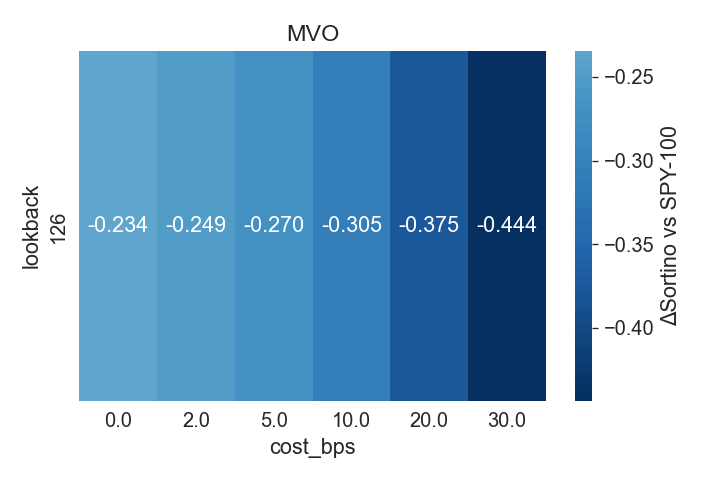

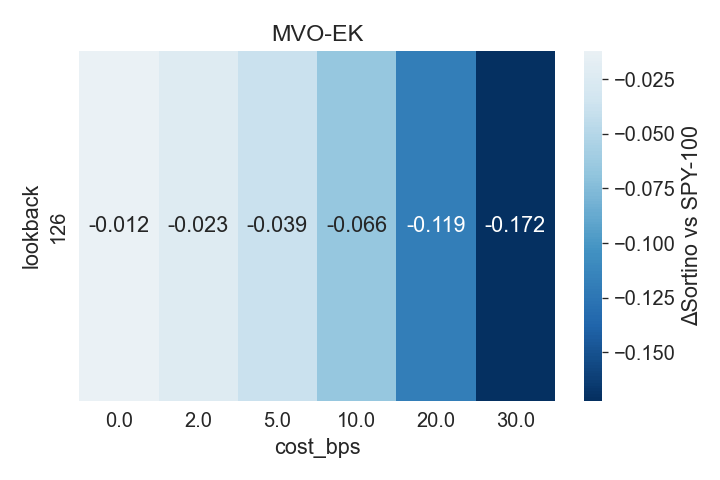

In [11]:
for img in sorted(f for f in os.listdir(COST) if f.endswith('.png')):
    show_img(f'{COST}/{img}', width=700)

---
## 6  Crisis Period Analysis

Performance breakdown during NBER recession periods (FRED USREC indicator). LW block-bootstrap
Sharpe tests applied to calm vs crisis regimes.

> **Note:** with `RECOMPUTE = True` this reads `results/backtest/base/daily_excess_returns.csv`
> (run Section 2 first) and downloads USREC from FRED — internet access and `pandas-datareader`
> are required.

In [12]:
CRISIS = 'results/crisis_analysis'

if RECOMPUTE:
    print('Running crisis analysis (downloads USREC from FRED) ...')
    run_script('run_crisis_analysis', [])
    print('Done.')

print('=== Period metrics ===')
show_df(f'{CRISIS}/period_metrics.csv')

=== Period metrics ===


,period,regime,strategy,start,end,AnnReturn,AnnVol,Sharpe,MaxDD,Calmar,NDays
0,Dot Com Bubble,crisis,HMVA,2001-04-02,2001-11-30,0.0013,0.1895,0.0069,-0.1814,0.0072,166.0
1,Dot Com Bubble,crisis,HMVA-mv,2001-04-02,2001-11-30,0.0206,0.1410,0.1463,-0.0972,0.2121,166.0
2,Dot Com Bubble,crisis,HRP,2001-04-02,2001-11-30,-0.0379,0.1423,-0.2667,-0.1726,-0.2198,166.0
3,Dot Com Bubble,crisis,MVO,2001-04-02,2001-11-30,-0.1748,0.2461,-0.7104,-0.2348,-0.7444,166.0
4,Dot Com Bubble,crisis,GMV,2001-04-02,2001-11-30,-0.0440,0.1301,-0.3383,-0.1293,-0.3404,166.0
5,Dot Com Bubble,crisis,EW,2001-04-02,2001-11-30,-0.0557,0.2112,-0.2638,-0.2657,-0.2096,166.0
6,Dot Com Bubble,crisis,SPY-100,2001-04-02,2001-11-30,-0.0120,0.2133,-0.0562,-0.2591,-0.0463,166.0
7,Global Financial Crisis,crisis,HMVA,2008-01-02,2009-06-30,-0.0589,0.2653,-0.2218,-0.3108,-0.1894,377.0
8,Global Financial Crisis,crisis,HMVA-mv,2008-01-02,2009-06-30,-0.0944,0.2414,-0.3913,-0.3085,-0.3061,377.0
9,Global Financial Crisis,crisis,HRP,2008-01-02,2009-06-30,-0.1845,0.2954,-0.6245,-0.4104,-0.4495,377.0


In [13]:
print('=== Regime summary (mean Sharpe: crisis vs calm) ===')
show_df(f'{CRISIS}/regime_summary.csv')
print('\n=== Subperiod LW Sharpe tests — HMVA base ===')
show_df(f'{CRISIS}/subperiod_sharpe_tests.csv')

=== Regime summary (mean Sharpe: crisis vs calm) ===


,strategy,regime,mean_sharpe,n_periods
0,HMVA,crisis,-0.0547,3
1,HMVA,calm,0.8002,1
2,HMVA-mv,crisis,-0.0910,3
3,HMVA-mv,calm,0.8192,1
4,HRP,crisis,-0.2341,3
5,HRP,calm,0.7901,1
6,MVO,crisis,-0.5991,3
7,MVO,calm,0.2798,1
8,GMV,crisis,-0.2131,3
9,GMV,calm,0.7934,1



=== Subperiod LW Sharpe tests — HMVA base ===


,period,regime,base,strategy,Sharpe_base,Sharpe_other,Sharpe_diff,CI_lo_95,CI_hi_95,LW_p,LW_p_adj,LW_reject
0,Calm,calm,HMVA,HMVA-mv,0.8002,0.8192,-0.0105,-0.1868,0.1716,0.9092,0.9308,False
1,Calm,calm,HMVA,HRP,0.8002,0.7901,0.0148,-0.3178,0.3384,0.9308,0.9308,False
2,Calm,calm,HMVA,MVO,0.8002,0.2798,0.4120,-0.0023,0.8217,0.0512,0.3072,False
3,Calm,calm,HMVA,GMV,0.8002,0.7934,0.0149,-0.2963,0.3241,0.9220,0.9308,False
4,Calm,calm,HMVA,EW,0.8002,0.6231,0.1587,-0.2058,0.5261,0.4042,0.8084,False
5,Calm,calm,HMVA,SPY-100,0.8002,0.5640,0.2115,-0.1648,0.5868,0.2836,0.8084,False
6,Recessions,crisis,HMVA,HMVA-mv,-0.1184,-0.2059,0.1014,-0.3800,0.5766,0.6752,0.6752,False
7,Recessions,crisis,HMVA,HRP,-0.1184,-0.4048,0.3081,-0.5549,1.0904,0.4458,0.5774,False
8,Recessions,crisis,HMVA,MVO,-0.1184,-0.5970,0.5119,-0.2570,1.3256,0.1980,0.5774,False
9,Recessions,crisis,HMVA,GMV,-0.1184,-0.3340,0.2479,-0.4534,0.9118,0.4778,0.5774,False


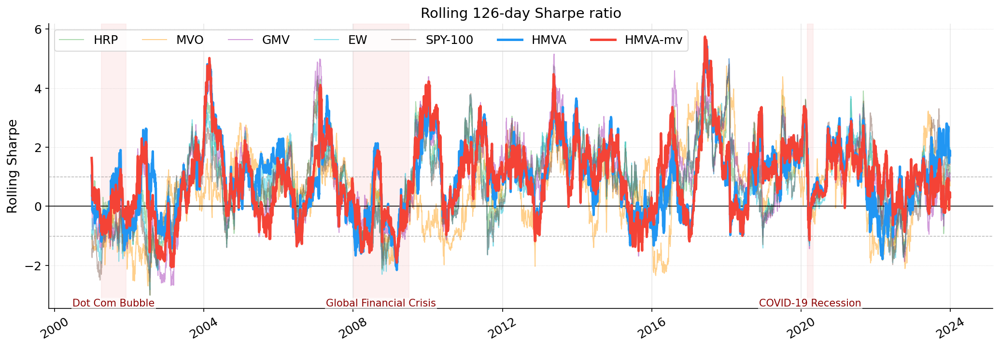

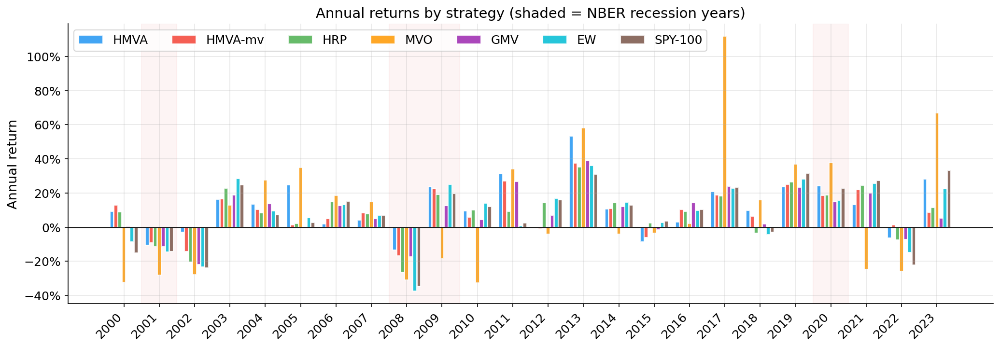

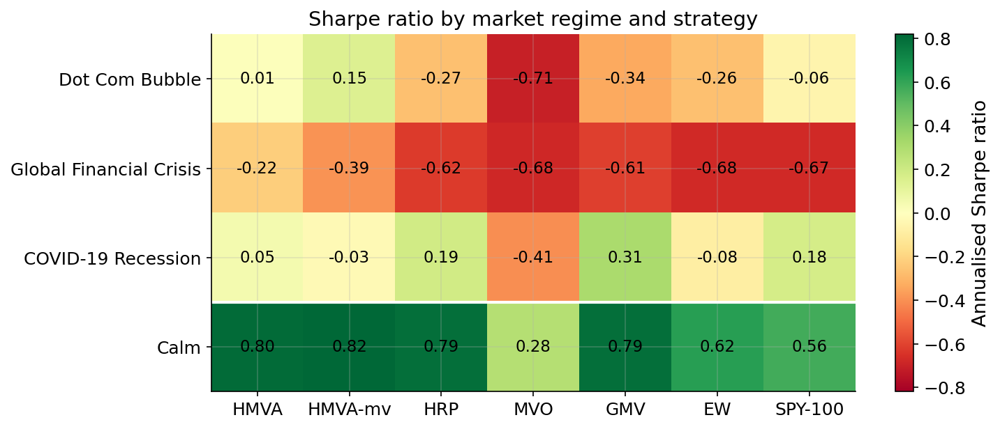

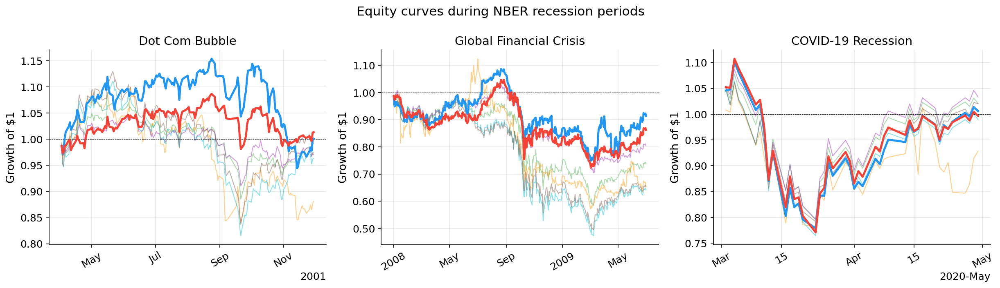

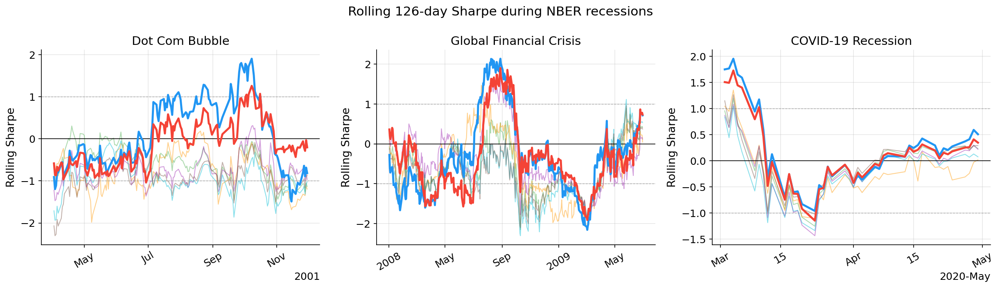

In [14]:
for img in [
    'rolling_sharpe_full.png',
    'annual_returns.png',
    'period_sharpe_heatmap.png',
    'crisis_equity.png',
    'crisis_rolling_sharpe.png',
]:
    show_img(f'{CRISIS}/{img}')